## [Neural network visualization toolkit for keras](https://github.com/raghakot/keras-vis)

In [1]:
from keras.applications.vgg16 import VGG16
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input, decode_predictions

vgg16 = VGG16(weights='imagenet')

/home/ubuntu/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


Instructions for updating:
Colocations handled automatically by placer.


In [2]:
from keras.applications.vgg19 import VGG19
from keras.preprocessing import image
from keras.applications.vgg19 import preprocess_input, decode_predictions

vgg19 = VGG19(weights='imagenet')

In [3]:
from keras.applications.resnet50 import ResNet50
from keras.preprocessing import image
from keras.applications.resnet50 import preprocess_input, decode_predictions

resnet50 = ResNet50(weights='imagenet')

In [4]:
from vis.utils import utils

vgg16_layer = utils.find_layer_idx(vgg16, 'predictions')
vgg19_layer = utils.find_layer_idx(vgg19, 'predictions')
resnet50_layer = utils.find_layer_idx(resnet50, 'fc1000')

layers = [vgg16_layer, vgg19_layer, resnet50_layer]

In [5]:
from keras import activations

vgg16.layers[vgg16_layer].activation = activations.linear
vgg16 = utils.apply_modifications(vgg16)

vgg19.layers[vgg19_layer].activation = activations.linear
vgg19 = utils.apply_modifications(vgg19)

resnet50.layers[resnet50_layer].activation = activations.linear
resnet50 = utils.apply_modifications(resnet50)

models = [vgg16, vgg19, resnet50]

/home/ubuntu/anaconda3/lib/python3.6/site-packages/keras/engine/saving.py:292: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


In [6]:
import os
import glob

images = glob.glob('img/*.jpg')
images

['img/lion.jpg',
 'img/dog.jpg',
 'img/panda.jpg',
 'img/cat.jpg',
 'img/tiger.jpg',
 'img/koala.jpg']

In [7]:
%matplotlib inline
from matplotlib import pyplot as plt
import matplotlib.cm as cm
import numpy as np

## [Attention (Saliency)](https://github.com/raghakot/keras-vis/blob/master/examples/vggnet/attention.ipynb)

/home/ubuntu/anaconda3/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/home/ubuntu/anaconda3/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/home/ubuntu/anaconda3/lib/python3.6/site-packages/keras/engine/saving.py:292: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


Instructions for updating:
Use tf.cast instead.


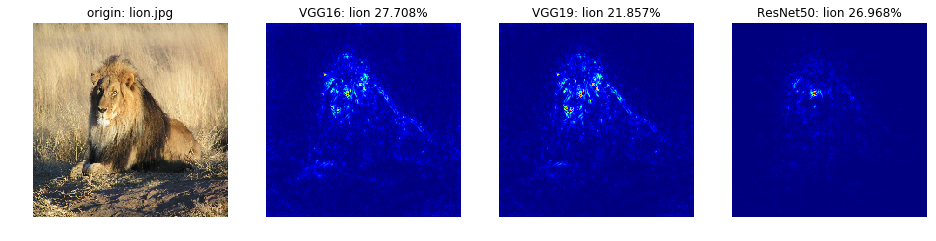

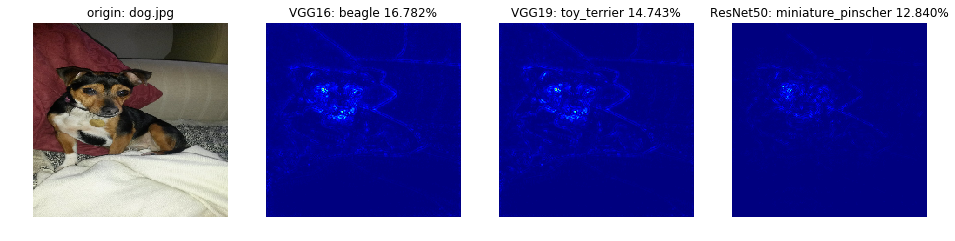

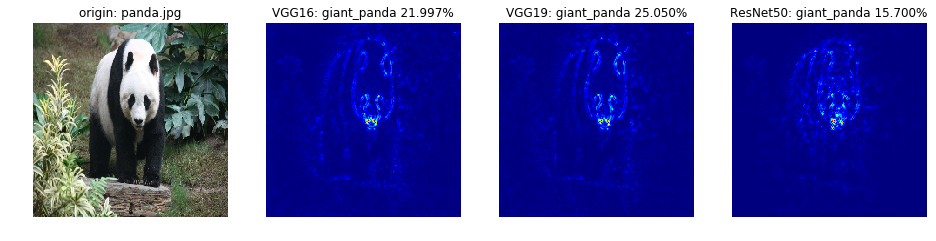

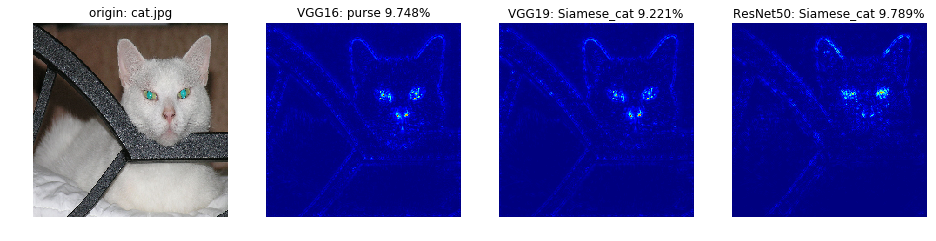

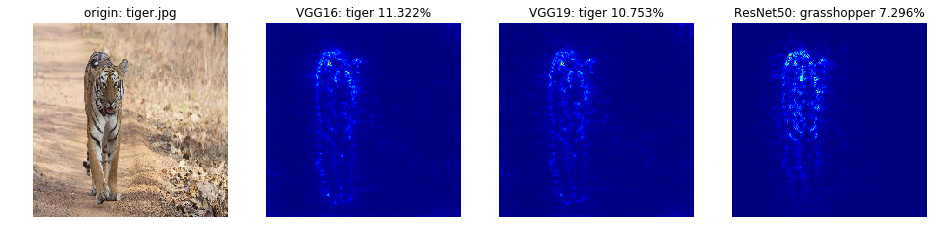

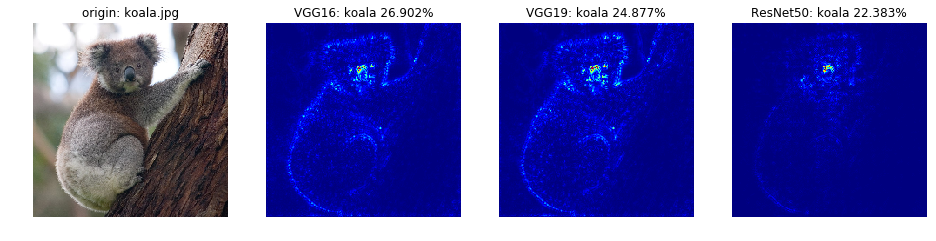

In [8]:
from vis.visualization import visualize_saliency

for img_path in images:
    plt.figure()
    f, ax = plt.subplots(1, 4, figsize = (16, 8))
    
    basename = os.path.basename(img_path)
    img = utils.load_img(img_path, target_size=(224, 224))
    x = np.expand_dims(img, axis=0)
    x = preprocess_input(x)
    
    ax[0].imshow(img)
    ax[0].set_title('origin: ' + basename)
    ax[0].axis('off')
    
    for model, layer_idx in zip(models, layers):
        pred = model.predict(x)
        pred_class = np.argmax(pred)
        decode = decode_predictions(pred, top=1)[0][0]
        
        grads = visualize_saliency(model, layer_idx, filter_indices=pred_class, 
            seed_input=img, backprop_modifier='guided')
        
        if model == vgg16:
            ax[1].imshow(grads, cmap='jet')
            ax[1].set_title('VGG16: %s %.3f%%' % (decode[1], decode[2]))
            ax[1].axis('off')
        if model == vgg19:
            ax[2].imshow(grads, cmap='jet')
            ax[2].set_title('VGG19: %s %.3f%%' % (decode[1], decode[2]))
            ax[2].axis('off')
        if model == resnet50:
            ax[3].imshow(grads, cmap='jet')
            ax[3].set_title('ResNet50: %s %.3f%%' % (decode[1], decode[2]))
            ax[3].axis('off')
        
    plt.savefig('saliency/%s' % basename)

## [Attention (grad-CAM)](https://github.com/raghakot/keras-vis/blob/master/examples/vggnet/attention.ipynb)

/home/ubuntu/anaconda3/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/home/ubuntu/anaconda3/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


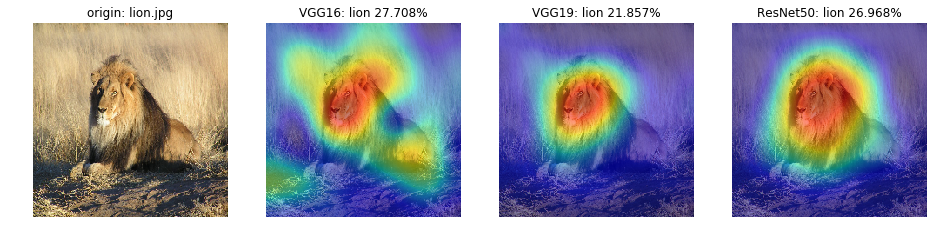

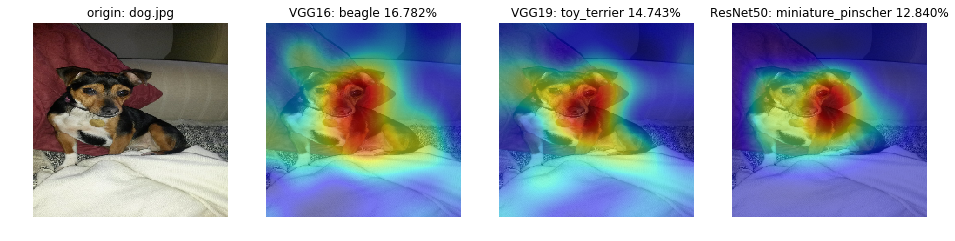

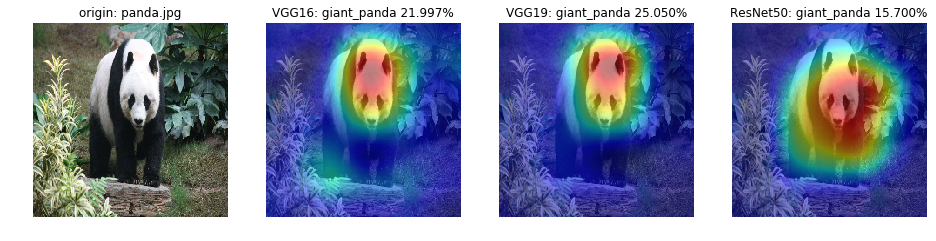

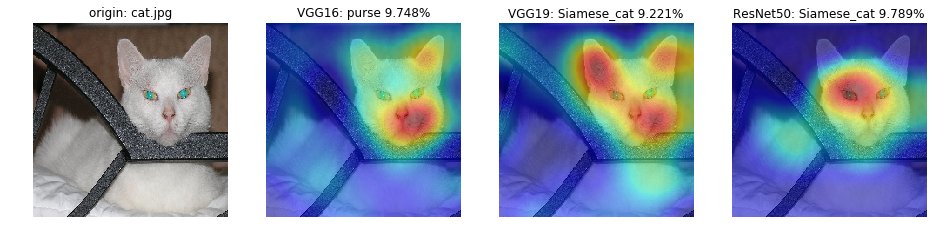

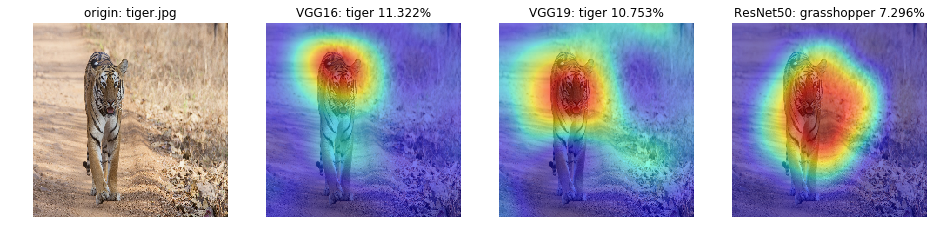

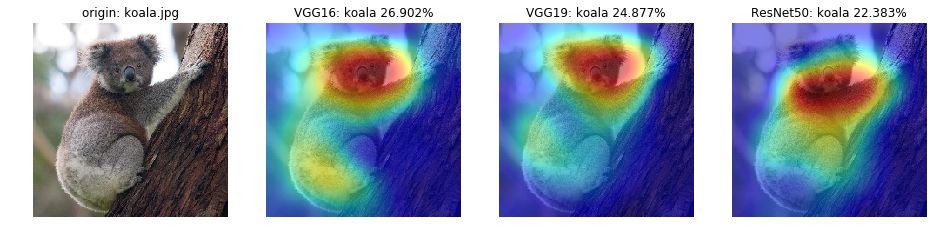

In [9]:
from vis.visualization import visualize_cam, overlay

for img_path in images:
    plt.figure()
    f, ax = plt.subplots(1, 4, figsize = (16, 8))
    
    basename = os.path.basename(img_path)
    img = utils.load_img(img_path, target_size=(224, 224))
    x = np.expand_dims(img, axis=0)
    x = preprocess_input(x)
    
    ax[0].imshow(img)
    ax[0].set_title('origin: ' + basename)
    ax[0].axis('off')
    
    for model, layer_idx in zip(models, layers):
        pred = model.predict(x)
        pred_class = np.argmax(pred)
        decode = decode_predictions(pred, top=1)[0][0]
        
        grads = visualize_cam(model, layer_idx, filter_indices=pred_class, 
            seed_input=img, backprop_modifier='guided')
        # Lets overlay the heatmap onto original image.    
        jet_heatmap = np.uint8(cm.jet(grads)[..., :3] * 255)
        
        if model == vgg16:
            ax[1].imshow(overlay(img, jet_heatmap), cmap='jet')
            ax[1].set_title('VGG16: %s %.3f%%' % (decode[1], decode[2]))
            ax[1].axis('off')
        if model == vgg19:
            ax[2].imshow(overlay(img, jet_heatmap), cmap='jet')
            ax[2].set_title('VGG19: %s %.3f%%' % (decode[1], decode[2]))
            ax[2].axis('off')
        if model == resnet50:
            ax[3].imshow(overlay(img, jet_heatmap), cmap='jet')
            ax[3].set_title('ResNet50: %s %.3f%%' % (decode[1], decode[2]))
            ax[3].axis('off')
    
    plt.savefig('cam/%s' % basename)

## [Activation Maximization](https://github.com/raghakot/keras-vis/blob/master/examples/vggnet/activation_maximization.ipynb)

### VGG16

In [10]:
vgg16.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

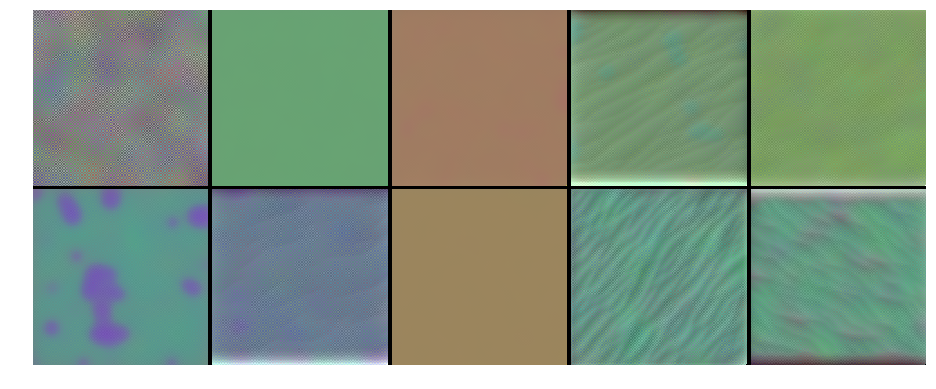

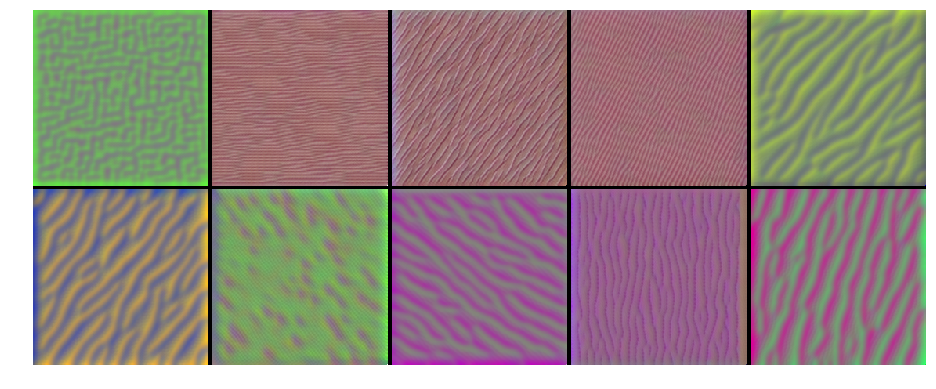

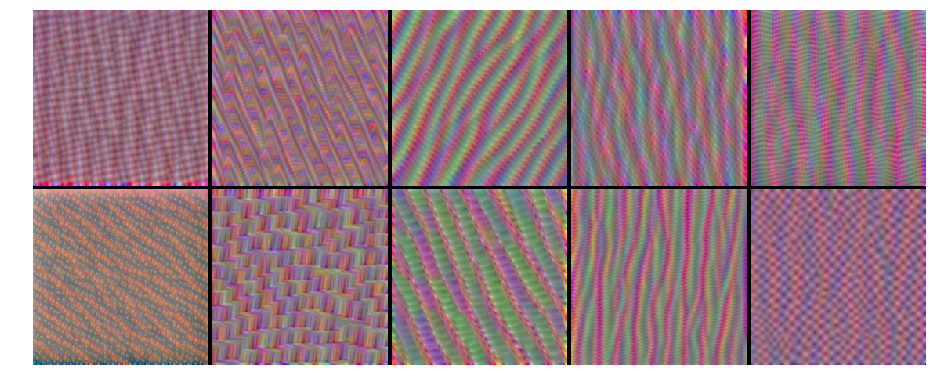

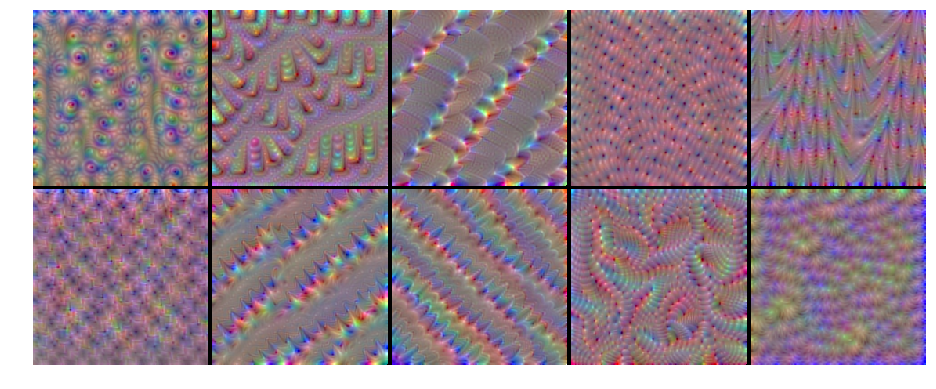

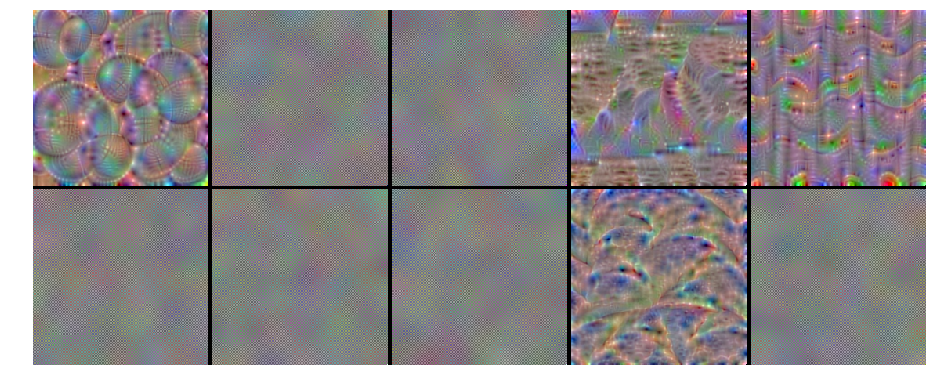

In [11]:
from vis.visualization import visualize_activation, get_num_filters

for layer_name in ['block1_conv2', 'block2_conv2', 'block3_conv3', 'block4_conv3', 'block5_conv3']:
    layer_idx = utils.find_layer_idx(vgg16, layer_name)

    # Visualize all filters in this layer.
    filters = np.random.permutation(get_num_filters(vgg16.layers[layer_idx]))[:10]

    # Generate input image for each filter.
    vis_images = []
    for idx in filters:
        img = visualize_activation(vgg16, layer_idx, filter_indices=idx)
 
        vis_images.append(img)

    # Generate stitched image palette with 5 cols so we get 2 rows.
    stitched = utils.stitch_images(vis_images, cols=5)    
    plt.figure(figsize = (16, 8))
    plt.imshow(stitched)
    plt.axis('off')
    plt.savefig('activation/vgg16/%s.jpg' % layer_name)

### VGG19

In [12]:
vgg19.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

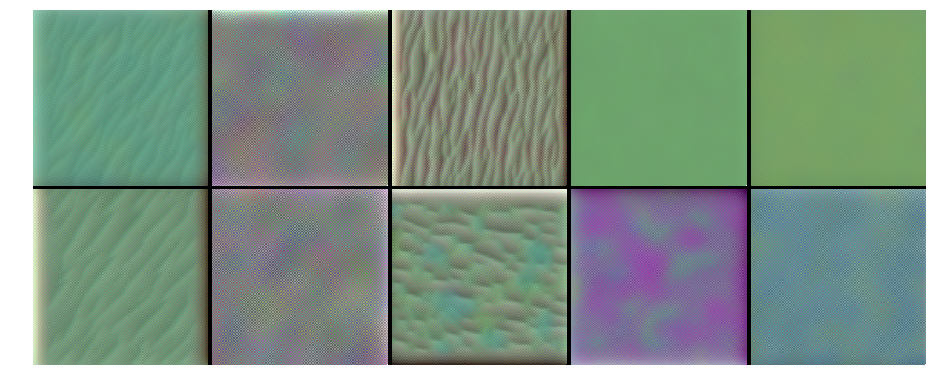

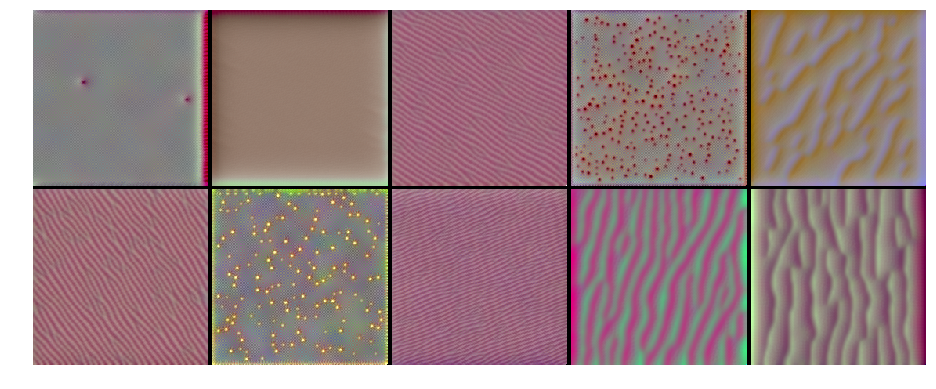

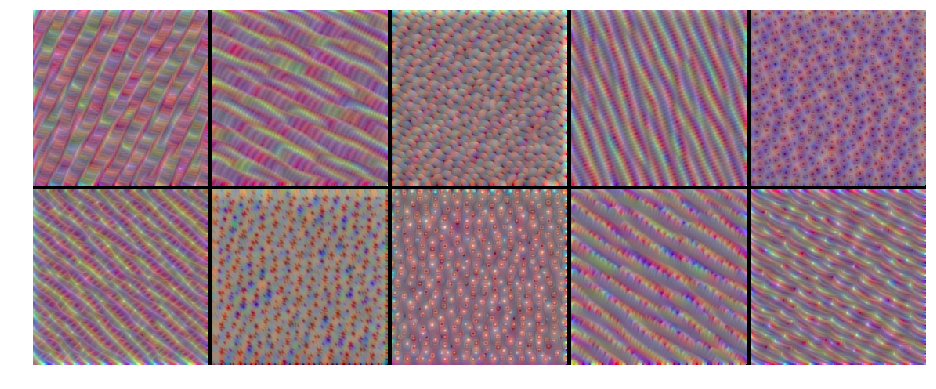

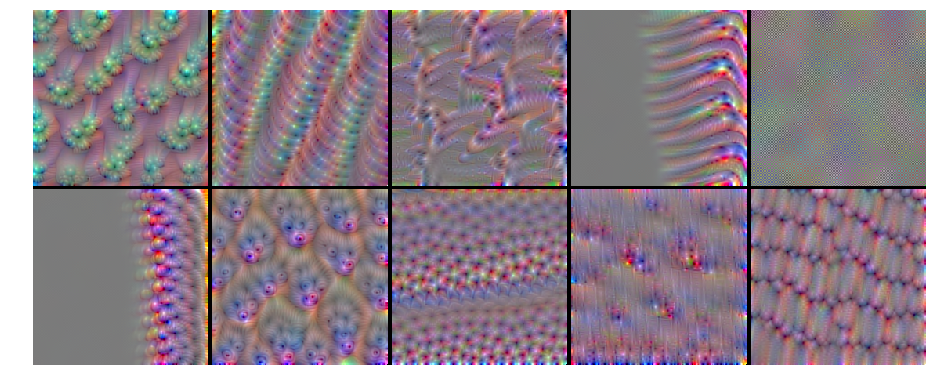

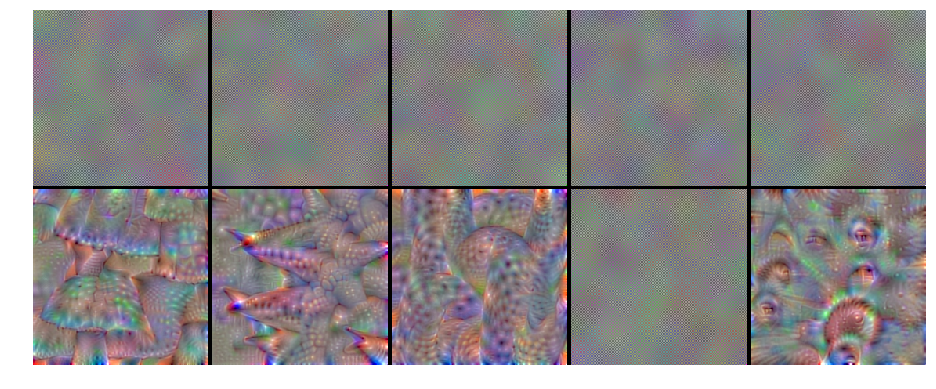

In [13]:
from vis.visualization import visualize_activation, get_num_filters

for layer_name in ['block1_conv2', 'block2_conv2', 'block3_conv4', 'block4_conv4', 'block5_conv4']:
    layer_idx = utils.find_layer_idx(vgg19, layer_name)

    # Visualize all filters in this layer.
    filters = np.random.permutation(get_num_filters(vgg19.layers[layer_idx]))[:10]

    # Generate input image for each filter.
    vis_images = []
    for idx in filters:
        img = visualize_activation(vgg19, layer_idx, filter_indices=idx)
 
        vis_images.append(img)

    # Generate stitched image palette with 5 cols so we get 2 rows.
    stitched = utils.stitch_images(vis_images, cols=5)    
    plt.figure(figsize = (16, 8))
    plt.imshow(stitched)
    plt.axis('off')
    plt.savefig('activation/vgg19/%s.jpg' % layer_name)

### ResNet50

In [14]:
resnet50.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_3[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 112, 112, 64) 256         conv1[0][0]                      
__________________________________________________________________________________________________
activation

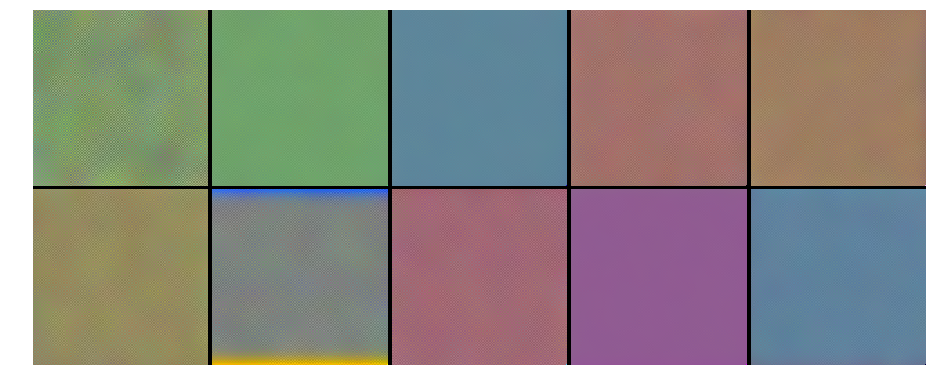

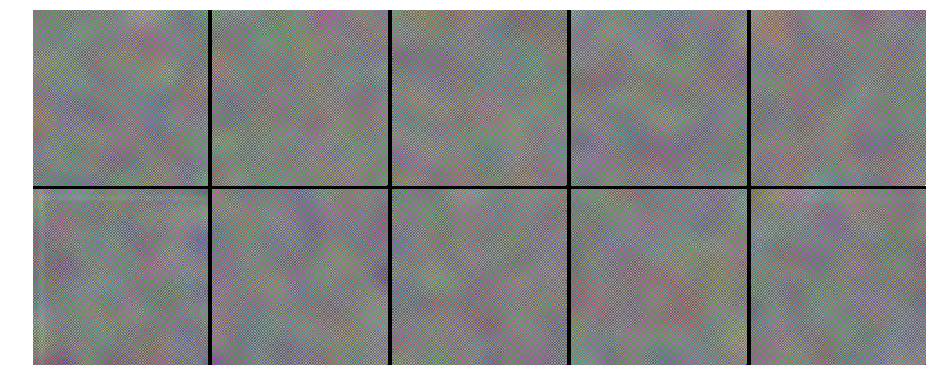

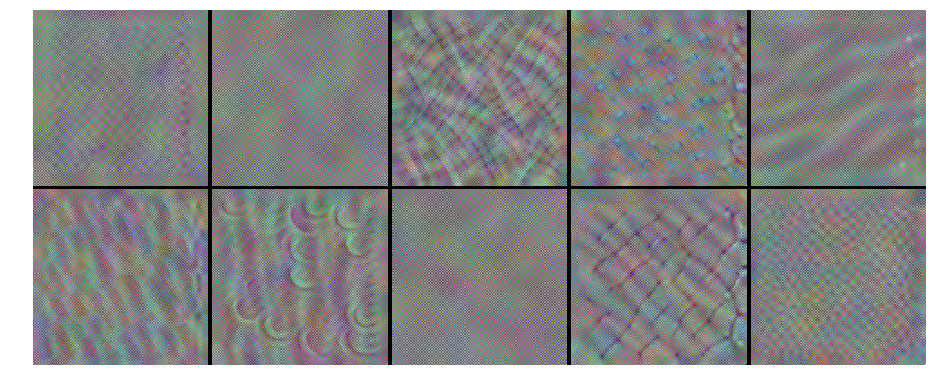

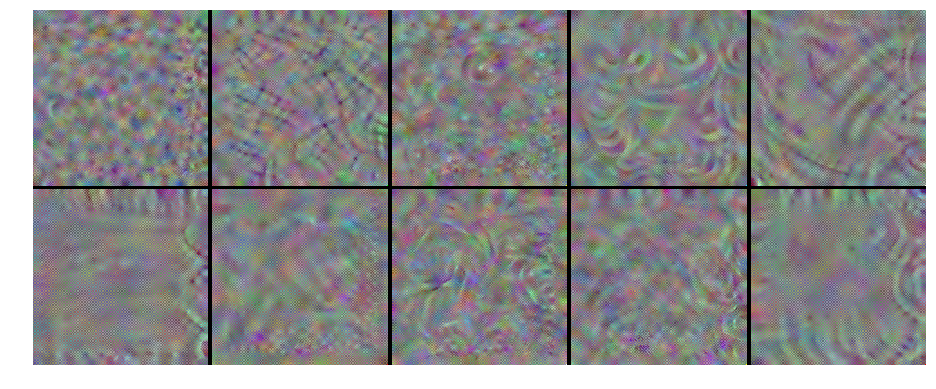

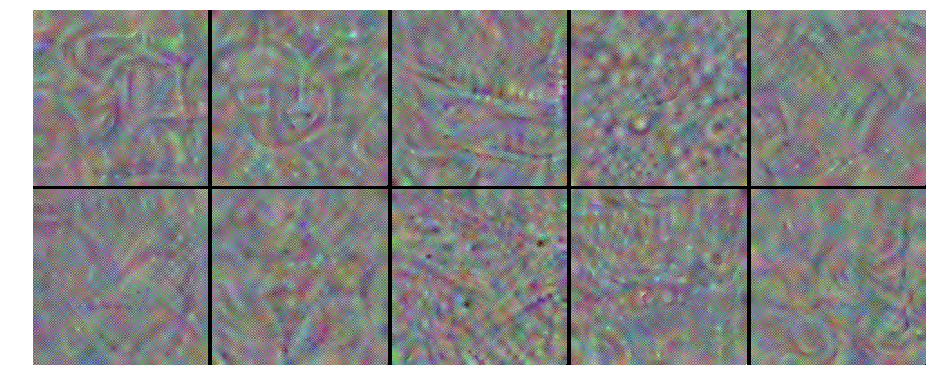

In [15]:
from vis.visualization import visualize_activation, get_num_filters

for layer_name in ['conv1', 'res2c_branch2c', 'res3d_branch2c', 'res4f_branch2c', 'res5b_branch2c']:
    layer_idx = utils.find_layer_idx(resnet50, layer_name)

    # Visualize all filters in this layer.
    filters = np.random.permutation(get_num_filters(resnet50.layers[layer_idx]))[:10]

    # Generate input image for each filter.
    vis_images = []
    for idx in filters:
        img = visualize_activation(resnet50, layer_idx, filter_indices=idx)
 
        vis_images.append(img)

    # Generate stitched image palette with 5 cols so we get 2 rows.
    stitched = utils.stitch_images(vis_images, cols=5)    
    plt.figure(figsize = (16, 8))
    plt.imshow(stitched)
    plt.axis('off')
    plt.savefig('activation/resnet50/%s.jpg' % layer_name)